<h1 align="center"> Wandering In Four Dimensions</h1> 
<h4 align="center">@stephencwelch</h4>

# 0. Introduction

I'm kindof a big deal...

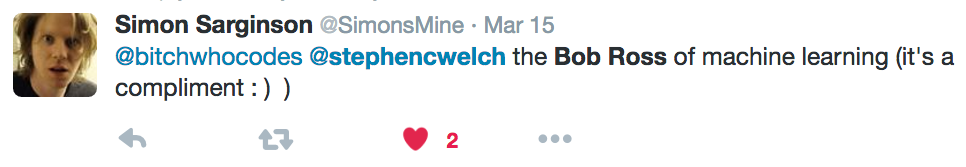

In [3]:
from IPython.display import Image
Image("graphics/bobRoss.png")

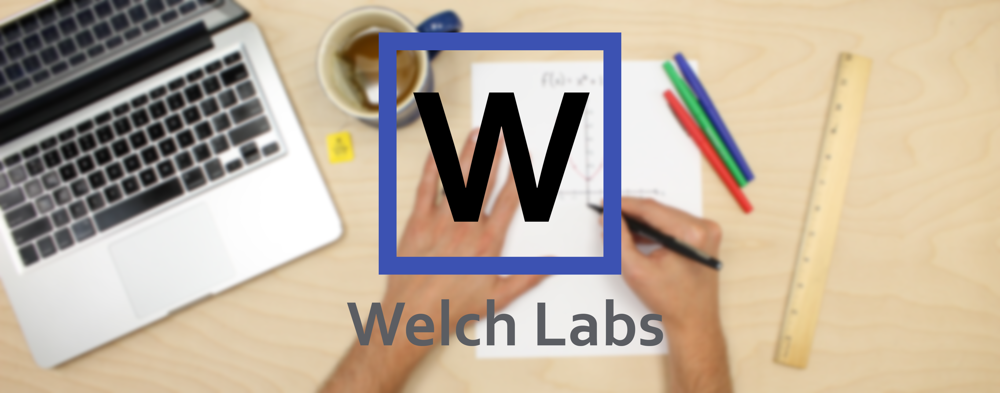

In [4]:
Image('graphics/channelHeader.png')

- I run a Math/Science/Machine Learning YouTube Channel called Welch Labs. 
- https://www.youtube.com/user/Taylorns34

# 0.1 So what are we like, talking about?

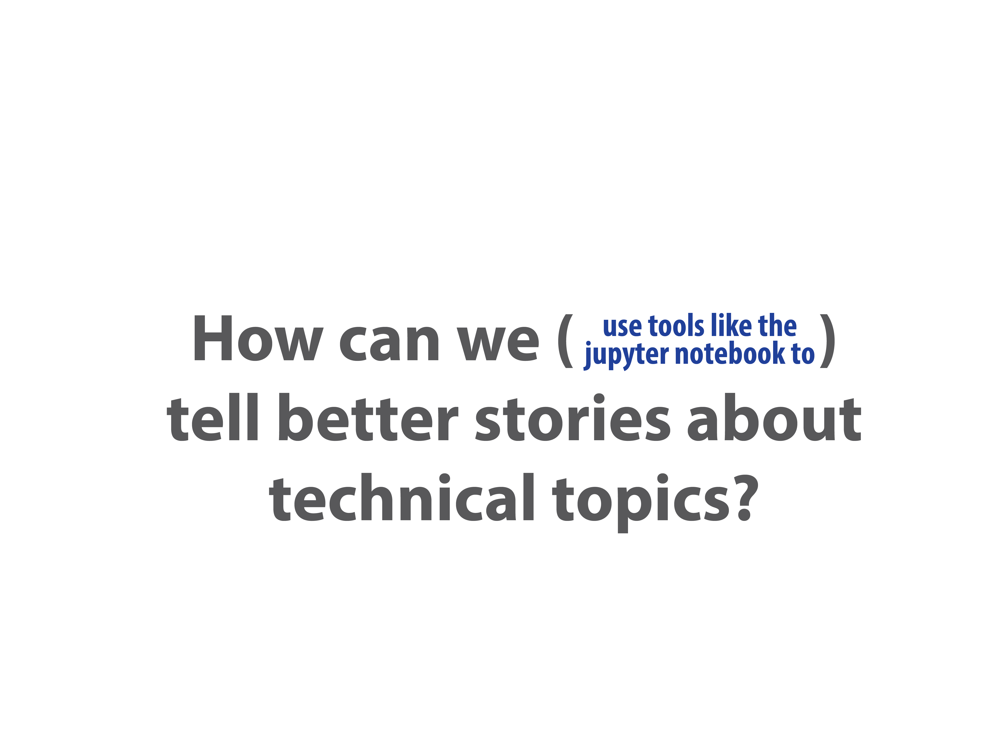

In [5]:
Image("graphics/bigQuestion-01.png")

- This is a question I ask myself alot
- Today I want to talk about one specific story I'm telling on my YouTube channel and how I've used the jupyter notebook and other amazing tools to tell the story.
- tl;dr If you appreciate irony, right now I'm using the jupyter notebook to tell a story about a technical topic about using the jupyter notebook to tell stories about technical topics. So Meta. 

# 0.2 Quick Audience Pole

# Are you familiar with imaginary numbers?

In [6]:
%pylab inline
import time

Populating the interactive namespace from numpy and matplotlib


In [7]:
numNo = 0
numSortof = 0
numYes = 0

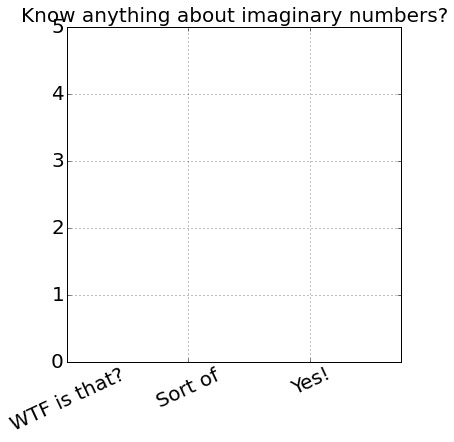

In [8]:
fig = figure(0, (6,6))
loc = np.arange(3)
bar(loc, [numNo, numSortof, numYes], 0.5, color = ['r', 'b', 'g'])
xticks(loc, ['WTF is that?', 'Sort of', 'Yes!'], fontsize = 20, rotation = 25)
yticks(fontsize = 20); grid(1); xlim([0, 2.75])
ylim([0, max([numYes, numSortof, numNo])+5]);
title('Know anything about imaginary numbers?', fontsize = 20)

# This talk is also about tools, which tools do you use?

In [9]:
numJupyter = 0 #Jupyter Notebook
numPython = 0
numPlotly = 0
numOpenCV = 0
numAdobe = 0 #Adobe Creative Suite
numVideo = 0

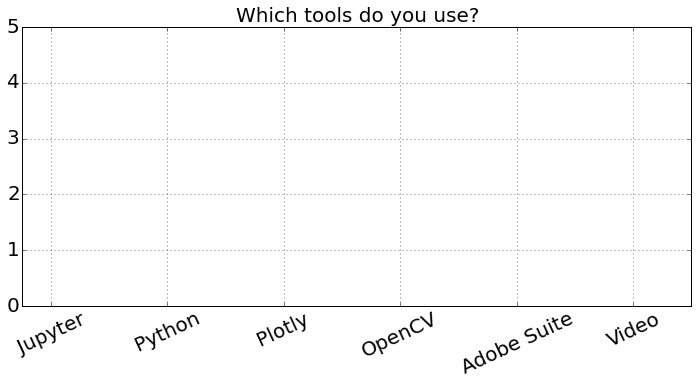

In [10]:
fig = figure(0, (12,5))
loc = np.arange(6)
bar(loc, [numJupyter, numPython, numPlotly, numOpenCV, numAdobe, numVideo], 0.5, color = ['b', 'g', 'r', 'c', 'm', 'y', 'k'])
xticks(loc + .25, ['Jupyter', 'Python', 'Plotly', 'OpenCV', 'Adobe Suite', 'Video'], fontsize = 20, rotation = 25)
grid(1); xlim([0, 5.75]); yticks(fontsize = 20)
ylim([0, max([numJupyter, numPython, numPlotly, numOpenCV, numAdobe, numVideo])+5]);
title('Which tools do you use?', fontsize = 20)


<h1 align="center"> How do we visualize functions of complex variables?</h1> 

- First, let's go back to high schoool for a minute and remember how functions of real variables work, and why the cartensian coordinate system is the shit.

In [14]:
from IPython.display import Image, display
from ipywidgets import interact

directory = 'graphics/realValuedFunction/'

def slideShow(imageNumber=1):
    if imageNumber < 10:
        slideName = 'Slide0' + str(imageNumber)    
    else: 
        slideName = 'Slide' + str(imageNumber) 
    display(Image(directory + slideName + '.png'))

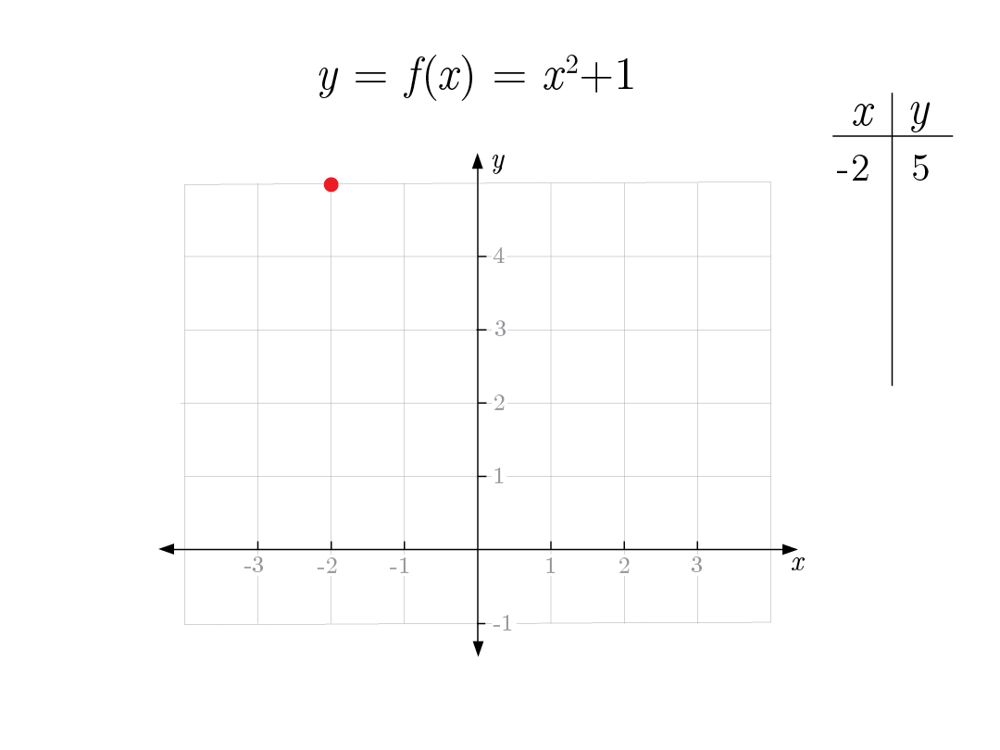

<function __main__.slideShow>

In [15]:
interact(slideShow, imageNumber = (0,6,1))

- The cartesian coordinate system is AMAZING (and fairly new).
- It allows us to take complicated functions and turn them into things are brains are way better at understanding-shapes!
- The picture says way more than the table.

# Alright, that was fun, now what about functions of complex variables?

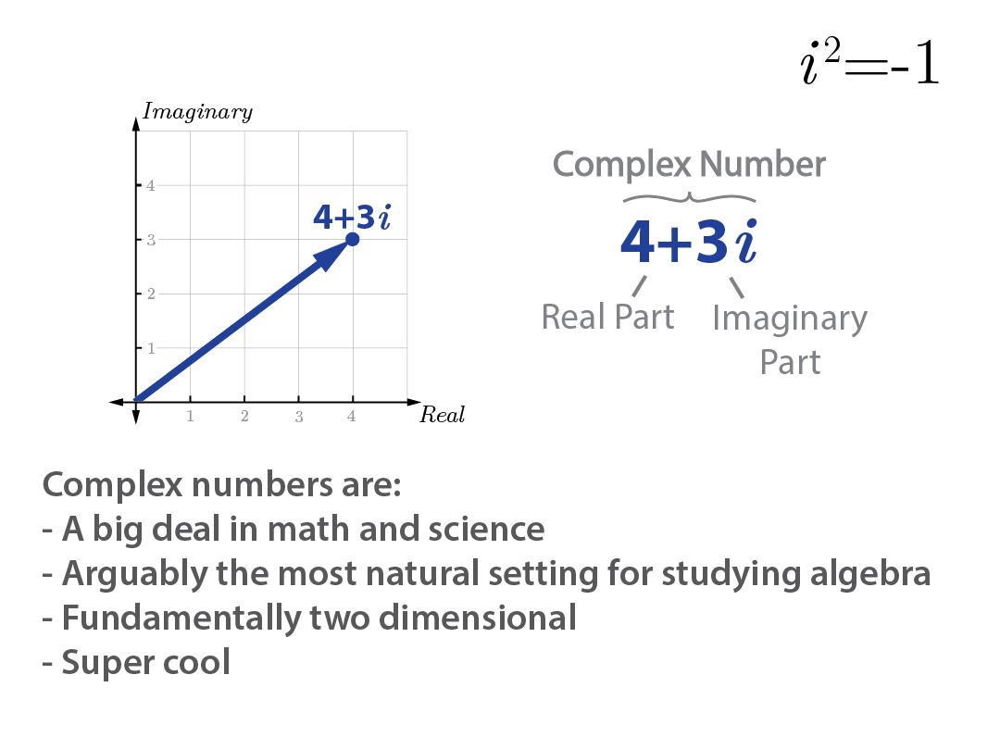

In [16]:
Image("graphics/complexNumberOnePager-01.png")

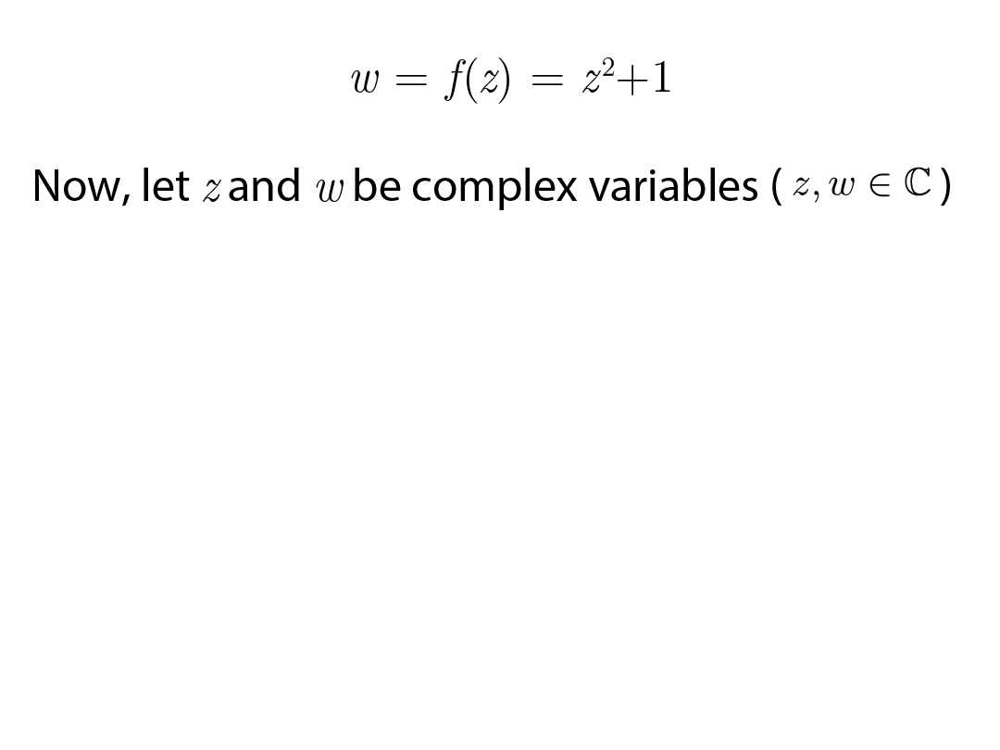

<function __main__.slideShow>

In [17]:
directory = 'graphics/complexFunction/'
interact(slideShow, imageNumber = (1,20,1))

# Instead of just mapping some points, what if we use technology to map ALL THE POINTS?

- What if I could just draw whatever I wanted, and use a video camera plus some python code to map all the pixels in my image?
- Let's load up an image, and think about how we might make this work.

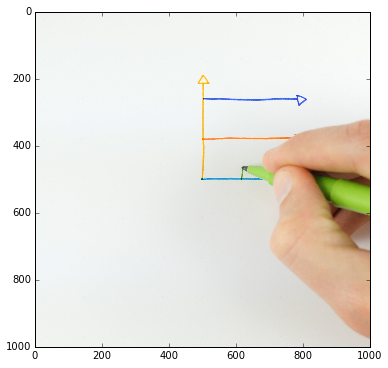

In [18]:
#Import an image to map:
import matplotlib.image as mpimg
img = mpimg.imread("graphics/imageToMapBIg.jpg")

figure(0, (6,6))
imshow(img)

## How can we map the pixels in our image according for our function $f(z) = z^2+1$?

# First, let's assign every pixel in the image to complex number. 

- To do this, we'll need to pick maximum and minimum complex numbers for the edges of our image.
- Somethning I learned early on, is that for this function, we need to map our image one half at a time. 

In [19]:
imgRight = img[:,img.shape[1]/2:]
inputBounds = np.array([0, 2, -2, 2])
inputResolution = imgRight.shape

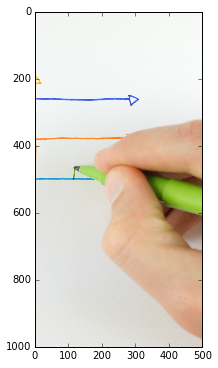

In [20]:
figure(0, (6,6))
imshow(imgRight)

### Now pick the dimensions we want the output image to be, and the bounding values for the output image

In [21]:
outputBounds = 6.5*np.array([-1,1,-1,1])
outputResolution = [1200,1200]

## Create a sampling grid with a complex number for each pixel.

In [22]:
#Create x and y sampling vectors
xInput=np.linspace(inputBounds[0], inputBounds[1], inputResolution[1])
yInput=np.linspace(inputBounds[2], inputBounds[3], inputResolution[0])

In [23]:
#Put sampling vectors on 2d grid:
x,y=np.meshgrid(xInput,yInput)
z=x+1j*y

## We now have a grid of complex input values

In [24]:
z[0:4,0:4]

array([[ 0.00000000-2.j        ,  0.00400802-2.j        ,
         0.00801603-2.j        ,  0.01202405-2.j        ],
       [ 0.00000000-1.995996j  ,  0.00400802-1.995996j  ,
         0.00801603-1.995996j  ,  0.01202405-1.995996j  ],
       [ 0.00000000-1.99199199j,  0.00400802-1.99199199j,
         0.00801603-1.99199199j,  0.01202405-1.99199199j],
       [ 0.00000000-1.98798799j,  0.00400802-1.98798799j,
         0.00801603-1.98798799j,  0.01202405-1.98798799j]])

## The next bit is surprisingly simple

- Numpy is able to handle complex numbers no problem, so performing our mapping is as simple as this.
- We're leaving out the +1 for now to keep things (relatively) simple.

In [25]:
w = z**2

## So we have our mapping, but now we have to actually move our pixels.

Here we'll compute a linear mapping using our input and output bounds to make sure things line up properly.

In [26]:
reSlope = float(outputResolution[1])/(outputBounds[1]-outputBounds[0])
imSlope = float(outputResolution[0])/(outputBounds[3]-outputBounds[2])

reIndex = (w.real*reSlope + outputResolution[1]/2).round().astype('int')
imIndex = (w.imag*imSlope + outputResolution[0]/2).round().astype('int')

## Create an empty matrix to map pixels to, and fill with NaNs

In [27]:
outputImageSize = outputResolution[:]
outputImageSize.append(3)

mappedImage = np.empty(outputImageSize)
mappedImage[:] = NAN

## Nasty Loop Time

- Please don't judge my terribly inefficient code. 
- Iterate through input image, mapping pixels to their proper location on the output
- Theres a couple of feautres here I figured out by trial and error:
    - Since some pixels will map to the same output location (more on this later hopefully), I've added a check for this.
    - I'm much more interested in mapping colored pixels than white pixels, I certainly don't want a white pixel to be mapped on top of a colored one, colored pixels get priority.

In [28]:
whiteThresh = 200
startTime = time.time()

for i in range(inputResolution[0]):
    for j in range(inputResolution[1]):
        #Only map pixels in the output range:
        if reIndex[i, j] > 0 and reIndex[i, j] < outputResolution[1]:
            if imIndex[i,j] > 0 and imIndex[i,j] < outputResolution[0]:
                #Check if that pixel has been filled yet:
                if isnan(mappedImage[imIndex[i,j], reIndex[i,j], 0]):
                    mappedImage[imIndex[i,j], reIndex[i,j], :] =  imgRight[i, j, :]
                #Check if non-white:
                elif imgRight[i, j, 0]< whiteThresh or imgRight[i, j, 1]< whiteThresh or \
                    imgRight[i, j, 2:]< whiteThresh:
                    mappedImage[imIndex[i,j], reIndex[i,j], :] =  imgRight[i, j, :] 
                    
print 'Time Elapsed = ' + str(time.time()-startTime) + 's.'

Time Elapsed = 7.4896299839s.


## Ok, we've mapped the pixels in our old image to our new image.

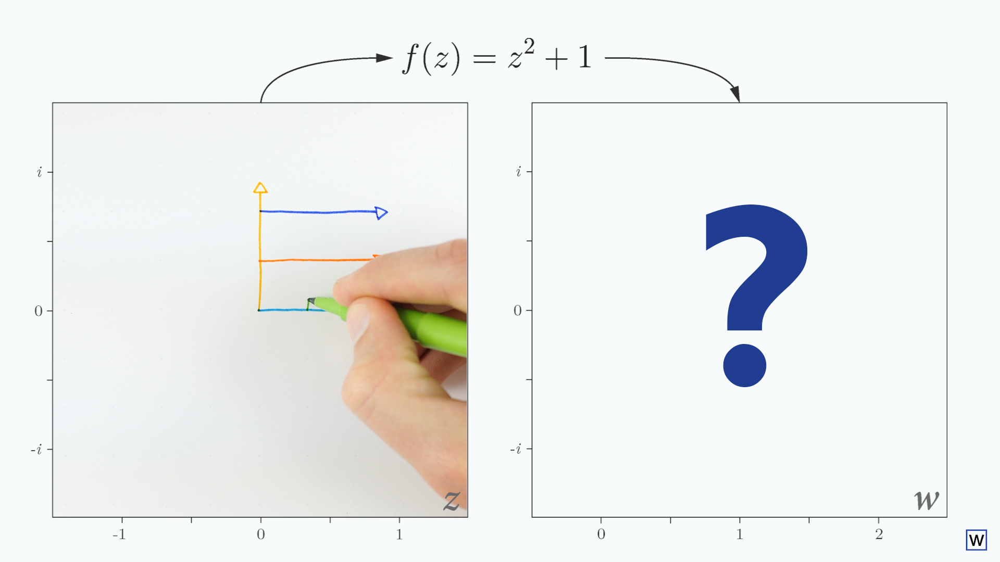

In [29]:
Image('graphics/aboutToMap.jpg')

# What do you think the tranformation $f(z) = z^2+1$ will do to our image?
- Enter your predictions now...

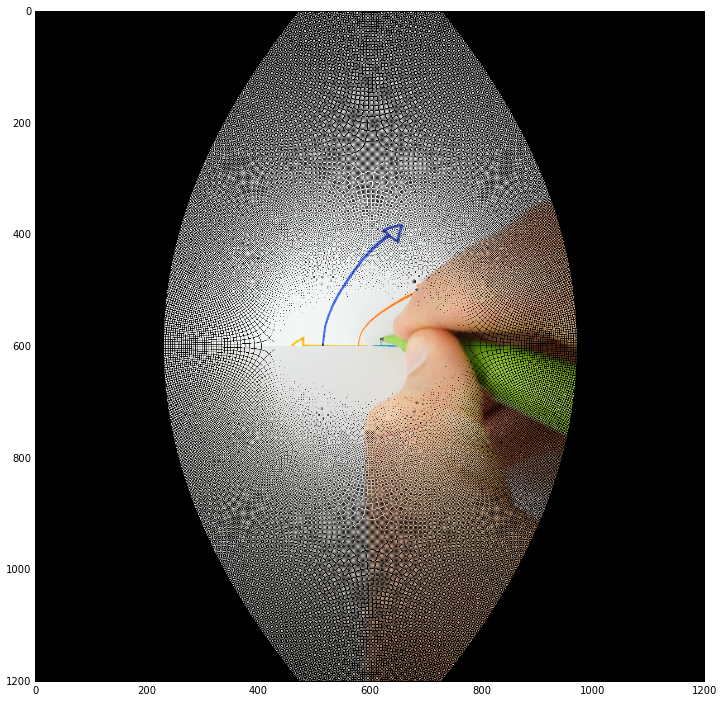

In [30]:
figure(0, (12,12))
mappedImageInt = mappedImage.astype('uint8')
imshow(mappedImageInt)

# Why does it look so weird?

- This actually says ALOT about our function!
- The straight borders of the image have been turned into curvy ones.
- We can really see the pattern of our conformal mapping (straight lines mapped to curved ones, which is pretty cool!)

# However, this isn't really what we had in mind - how do we fix it?
- We'll use a very cool algorithm called inpainting!
- The open computer vision library (opencv) has a nice (but kinda slow...oh well) implementation.
- It uses Navier Stokes equation from fluid mechanics - how cool is that?!?!
- http://docs.opencv.org/2.4/modules/photo/doc/inpainting.html

In [31]:
#Import opencv 2
import cv2

## Create a mask of all the pixels that didn't get filled 
- This mask tells our algorithm where to inpaint

In [32]:
mask = np.zeros((outputResolution[0], outputResolution[1]), dtype='uint8')
mask[isnan(mappedImage[:, :, 0])] = 1

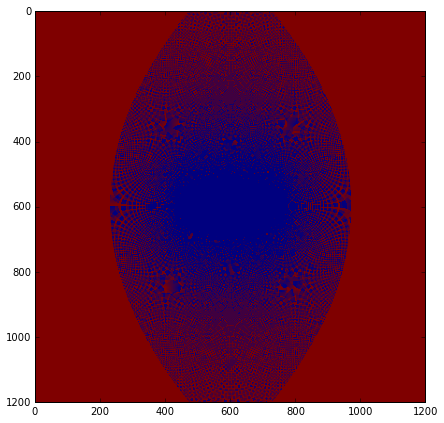

In [33]:
figure(0, (7,7))
imshow(mask)

## Take central crop to cut out curved boundaries

In [34]:
maskCentral = mask.copy()[300:900, 300:900]
mappedImageCentral = mappedImageInt.copy()[300:900, 300:900,:]

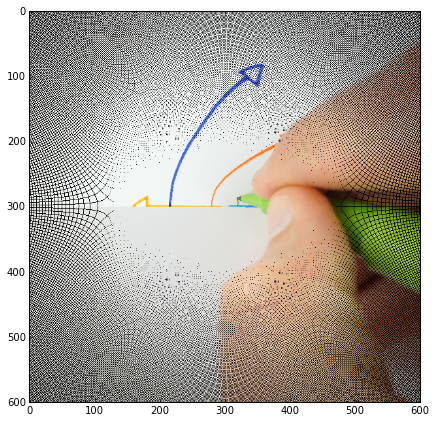

In [35]:
fig = figure(0, (7,7))
imshow(mappedImageCentral)

## And fill in gaps!

In [ ]:
startTime = time.time()
finalImage = cv2.inpaint(mappedImageCentral, maskCentral, 3, cv2.INPAINT_NS)
print 'Time Elapsed = ' + str(time.time() - startTime) + 's.'

In [ ]:
fig = figure(0, (9,9))
imshow(finalImage)

# Boom!

- Now all that's left to do is map the other side of the image, and iterate through a bunch of images to make a video, let's jump to the final result.

In [106]:
from IPython.display import YouTubeVideo
YouTubeVideo('pNp8Qf20-sA', start = 372, width = 800, height = 450)

- So there we have it, using python and opencv, we were able to get a better feel for how these functions work!
- While I didn't use Jupyter in the final result, the notebook was crucial to iterating quickly on python code, and I ran all processing code in the notebook. 

# More Visualizations More Problems

- When we consider the inverse function, $z = \pm \sqrt{w}$, we run into some weird behavior!

In [24]:
from IPython.display import YouTubeVideo
YouTubeVideo('0hiWbdc8QEk', start = 330, width = 800, height = 450)

# What the F is going on here?

- Why do some paths jump and others don't?
- It turns out our 2 complex plane setup is cool, but it doesn't tell the whole story!


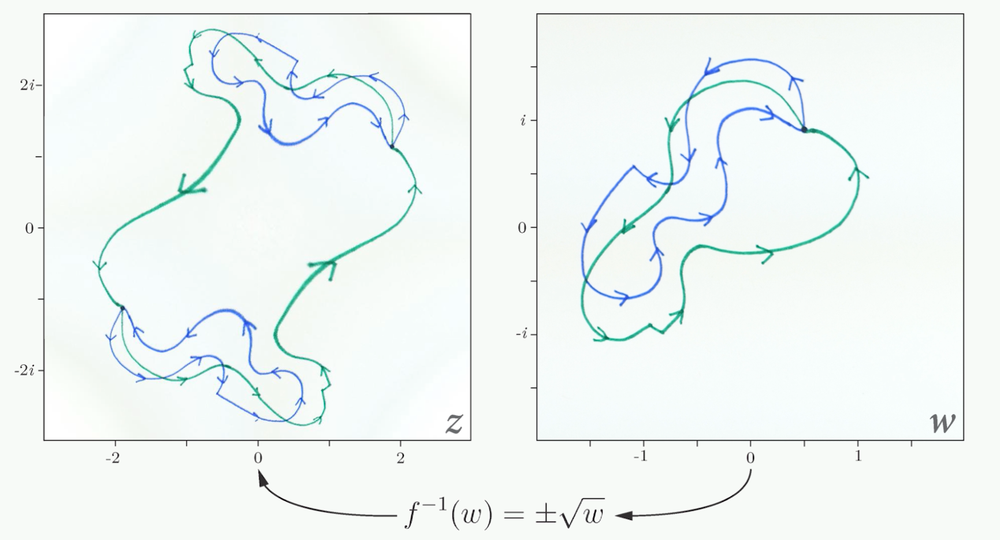

In [40]:
Image('graphics/monodromy.png')

- Fortunately, someone much smarter than me has already given this problem some serious thought. In the 1850s.

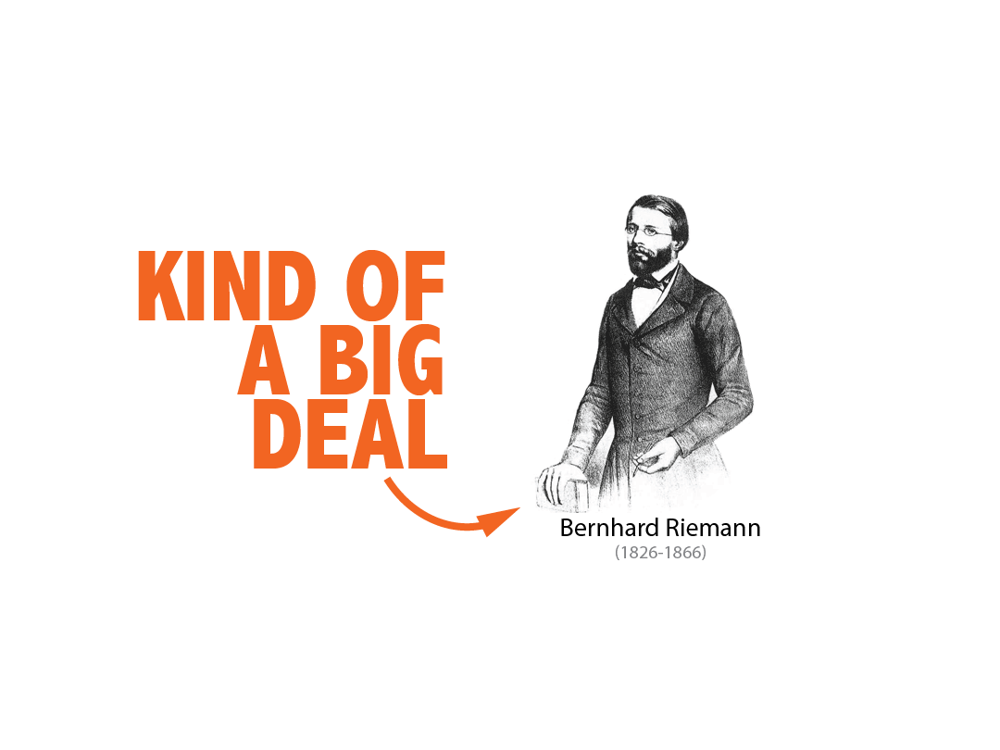

In [27]:
Image('graphics/riemann-01.png')

# Reimann realized that the input (domain) to our function should not be a flat plane, but a curved surface living in 3d space.

- Here's a visualiztion of the Riemann Surface for out function $w = \pm \sqrt{z} $ created with the available technology in 1865.
- Check out the Youtube Series to see why this is the case.

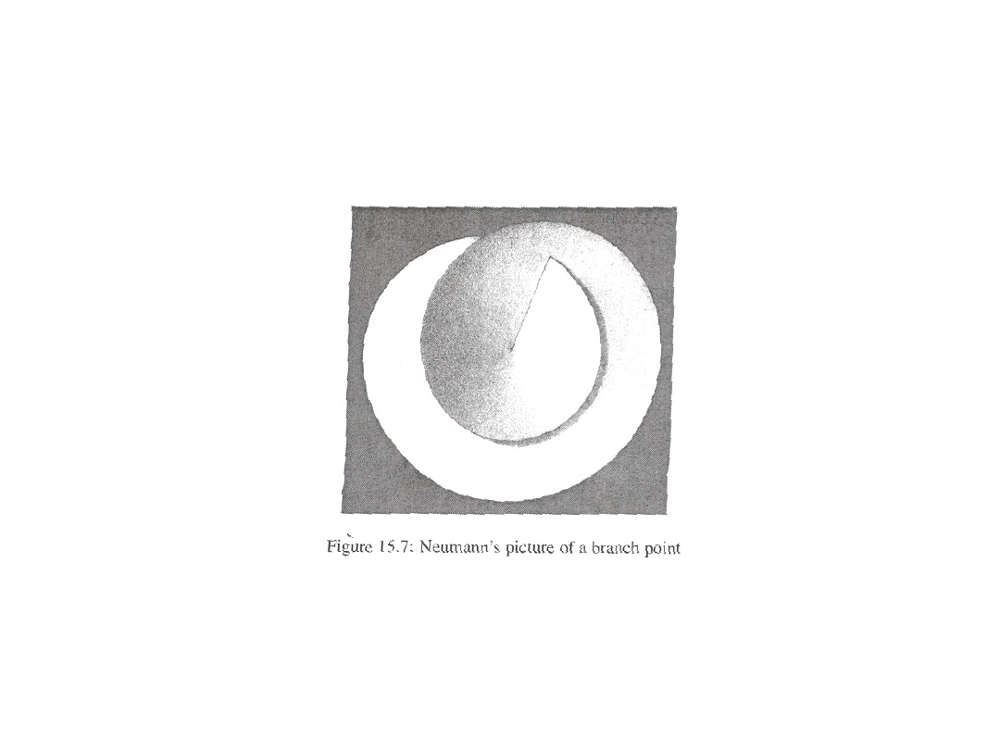

In [28]:
Image('graphics/1865RiemanSurface-01.png')

# Ok, got it? Me Neither. 
- Let's use some modern technology to tell a better story about Riemann Surface.
- To visualize our surface, we'll use the awesome plotting library plotly.
- This will give us more perspective into how our function warps space.

In [30]:
import plotly 
plotly.tools.set_credentials_file(username='stephenwelch', api_key='kb11fxg87i')

plotly.offline.init_notebook_mode()
from plotly.graph_objs import *

## Since we're using the plotly library is a bit of a non-standard way, we're going to have to write kinda alot of code.

- Here we go.

In [31]:
#Slight gray colorscale for shading planes:
colorscale = [[0, 'rgb(100, 100, 100)'], [1, 'rgb(101, 101, 101)']]

# Function to create a grid on our surface, maybe this will be built into plotly sooner or later :)
def unravelRows(w):
    rowRavel = w[0,:]

    #Start backward:
    direction = 'backward'
    for rowCount in arange(1, w.shape[0]):
        if direction == 'backward':
            rowRavel = np.concatenate((rowRavel, w[rowCount, ::-1]))
            direction = 'forward'
        elif direction == 'forward':
            rowRavel = np.concatenate((rowRavel, w[rowCount, :]))
            direction = 'backward'
            
    return rowRavel

def unravelCols(w):
    colRavel = w[:,0]

    #Start backward:
    direction = 'backward'
    for colCount in arange(1, w.shape[1]):
        if direction == 'backward':
            colRavel = np.concatenate((colRavel, w[::-1, colCount]))
            direction = 'forward'
        elif direction == 'forward':
            colRavel = np.concatenate((colRavel, w[:, colCount]))
            direction = 'backward'
            
    return colRavel

## Let's start by putting our (input) w-plane in 3d space

In [32]:
#Make a nice grid
x = np.arange(-2.5, 2.6, .1)
y = np.arange(-2.5, 2.6, .1)
xGrid, yGrid = meshgrid(x,y)
z = xGrid + -1j*yGrid

#Move surface down so everythin fits later
wPlaneHeight = -3

#Downsampling from full grid to grid lines:
samplingInterval = 5

Now, start making lots and lots and lots of plotly objects. 

In [33]:
wRows = Scatter3d(
        x=unravelRows(z[::samplingInterval, :]).real,
        y=unravelRows(z[::samplingInterval, :]).imag,
        z=wPlaneHeight*np.ones(shape(unravelRows(z[::samplingInterval, :]))), 
        mode = 'lines',
        line = dict(color='black'), 
        opacity = 0.3,
        showlegend = False
    )

wCols = Scatter3d(
        x=unravelCols(z[:, ::samplingInterval]).real,
        y=unravelCols(z[:, ::samplingInterval]).imag,
        z=wPlaneHeight*np.ones(shape(unravelRows(z[:, ::samplingInterval]))), 
        mode = 'lines',
        line = dict(color='black'), 
        opacity = 0.3,
        showlegend = False
    )

wXAxis = Scatter3d(
        x = [min(x), max(x)],
        y = [0, 0], 
        z = [wPlaneHeight, wPlaneHeight], 
        mode = 'lines', 
        line = dict(color='black'),
        showlegend = False
    )

wYAxis = Scatter3d(
        x = [0,0],
        y = [min(y), max(y)], 
        z = [wPlaneHeight, wPlaneHeight], 
        mode = 'lines', 
        line = dict(color='black'),
        showlegend = False
    )

wSurf = Surface(
        x=z.real,
        y=z.imag,
        z=wPlaneHeight*np.ones(shape(z)), 
        zauto = False, 
        autocolorscale = False,
        showscale = False, 
        colorscale = colorscale, 
        opacity = 0.8,
        showlegend = False
    )

- Let's have a look at what we've got thusfar.

In [34]:
xaxis = dict(title = '', showline=False, showgrid=False, zeroline=False, showticklabels = False)
yaxis = dict(title = '', showline=False, showgrid=False, zeroline=False, showticklabels = False)
zaxis = dict(title = '', showline=False, showgrid=False, zeroline=False, showticklabels = False)

scene = dict(xaxis = xaxis, yaxis = yaxis, zaxis = zaxis)

layout = Layout(autosize = False, width = 800, height = 600, scene = scene)

data = Data([wCols, wRows, wSurf, wXAxis, wYAxis])

fig = Figure(data=data, layout = layout)

plotly.plotly.iplot(fig)

# We have a w-plane! 

# Part of Riemann's idea here was to represent our z-values as the height of a surface above the w-plane.

- Of course, z has a real and imaginary part, so we can only show one at a time!
- Let's show the real part of z as the height of our surface.

In [36]:
#Our square root function is a multifunction, with a plus and minus part:
w1 = sqrt(z)
w2 = -1*sqrt(z)

rangeToPlot = np.arange(-2.5, 2.6, .1)

xAxis = rangeToPlot + 1j*np.zeros(len(rangeToPlot))
xAxisMappedW1 = sqrt(xAxis)

yAxis = np.zeros(len(rangeToPlot)) + 1j*rangeToPlot
yAxisMappedW1 = sqrt(yAxis)

Lots more plotly objects

In [37]:
w1Rows = Scatter3d(
        x=unravelRows(z[::samplingInterval,:]).real,
        y=unravelRows(z[::samplingInterval,:]).imag,
        z=unravelRows(w1[::samplingInterval,:]).real, 
        mode = 'lines',
        line = dict(color='black'), 
        opacity = 0.3,
        showlegend = False
    )

w1Cols = Scatter3d(
        x=unravelCols(z[:, ::samplingInterval]).real,
        y=unravelCols(z[:, ::samplingInterval]).imag,
        z=unravelCols(w1[:, ::samplingInterval]).real, 
        mode = 'lines',
        line = dict(color='black'), 
        opacity = 0.3,
        showlegend = False
    )

w1Surf = Surface(
        x=z.real,
        y=z.imag,
        z=w1.real, 
        zauto = False, 
        autocolorscale = False,
        showscale = False, 
        colorscale = colorscale, 
        opacity = 0.8,
        showlegend = False
    )

w1XAxis = Scatter3d(
        x = xAxis.real,
        y = xAxis.imag, 
        z = xAxisMappedW1.real,
        mode = 'lines', 
        line = dict(color='black'),
        showlegend = False
    )

w1YAxis = Scatter3d(
        x = yAxis.real,
        y = yAxis.imag, 
        z = yAxisMappedW1.real,
        mode = 'lines', 
        line = dict(color='black'),
        showlegend = False
    )

In [38]:
xAxis = rangeToPlot + 1j*np.zeros(len(rangeToPlot))
xAxisMappedW2 = -sqrt(xAxis)

yAxis = np.zeros(len(rangeToPlot)) + 1j*rangeToPlot
yAxisMappedW2 = -sqrt(yAxis)

In [39]:
w2Rows = Scatter3d(
        x=unravelRows(z[::samplingInterval,:]).real,
        y=unravelRows(z[::samplingInterval,:]).imag,
        z=unravelRows(w2[::samplingInterval,:]).real, 
        mode = 'lines',
        line = dict(color='black'), 
        opacity = 0.3,
        showlegend = False
    )

w2Cols = Scatter3d(
        x=unravelCols(z[:, ::samplingInterval]).real,
        y=unravelCols(z[:, ::samplingInterval]).imag,
        z=unravelCols(w2[:, ::samplingInterval]).real, 
        mode = 'lines',
        line = dict(color='black'), 
        opacity = 0.3,
        showlegend = False
    )

w2Surf = Surface(
        x=z.real,
        y=z.imag,
        z=w2.real, 
        zauto = False, 
        autocolorscale = False,
        showscale = False, 
        colorscale = colorscale, 
        opacity = 0.8,
        showlegend = False
    )

w2XAxis = Scatter3d(
        x = xAxis.real,
        y = xAxis.imag, 
        z = xAxisMappedW2.real,
        mode = 'lines', 
        line = dict(color='black'),
        showlegend = False
    )

w2YAxis = Scatter3d(
        x = yAxis.real,
        y = yAxis.imag, 
        z = yAxisMappedW2.real,
        mode = 'lines', 
        line = dict(color='black'),
        showlegend = False
    )

- Let's have a look at what we've got here...

In [58]:
xaxis = dict(title = 'u', showline=True, showgrid=False, zeroline=False, showticklabels = True)
yaxis = dict(title = 'v', showline=True, showgrid=False, zeroline=False, showticklabels = True)
zaxis = dict(title = 'x', showline=True, showgrid=False, zeroline=False, showticklabels = True)

scene = dict(xaxis = xaxis, yaxis = yaxis, zaxis = zaxis)

layout = Layout(autosize = False, width = 800, height = 600, scene = scene)

data = Data([wCols, wRows, wSurf, wXAxis, wYAxis, w1Cols, w1Rows, w1Surf, w1XAxis, w1YAxis, \
                 w2Cols, w2Rows, w2Surf, w2XAxis, w2YAxis])

fig = Figure(data=data, layout = layout)

plotly.plotly.iplot(fig)

- Every point on our surface corresponds to a solution to our equation $f(z) = z^2$
- Of course, we can only show 3 of the 4 variables we need to completely represent our four dimensional function.
- But more importantly, 

## How does our Riemann Surface help explain our weird path behavior (monodromy)?
- Wait for it...

In [45]:
YouTubeVideo('BsPcCKUQNkk', width = 800, height = 450)

# Thank you!